In [ ]:
!pip install segmentation_models_pytorch

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 5.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.3/121.3 kB 9.1 MB/s eta 0:00:00
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16424 sha256=6f12f778af070f077cbe3df7341caa047d39d5987b18d804bae6874ed123d2f3
  Stored in directory: /root/.cache/pip/wheels/8b/6f/9b/231a832f811ab6ebb1b32455b177ffc6b8b1cd8de19de70c09
  Created wheel for pretrainedmodels: filename=pretrainedmodels-0.7.4-py3-none-any.whl size=60944 sha256=3a74a905cc0f765cce59b739c529a5910d3673f42c81869c4d2f245cdc886ae7
  Stored in directory: /root/.cache/pip/wheels/5f/5b/96/fd94bc35962d7c6b699e8814db545155ac91d2b95785e1b035
Successfully built efficientnet-pytorch pretrainedmodels


In [ ]:
from google.colab import drive
drive.mount('/content/drive')
!unzip '/content/drive/MyDrive/ChangeDetectionMergedDividedSplit-png.zip' -d '/content/ChangeDetectionMergedDividedSplit-png'

Streaming output truncated to the last 5000 lines.
  inflating: /content/ChangeDetectionMergedDividedSplit-png/test/cd1_Output/cd1_m_Poland_Warsaw_C_2.png  
  inflating: /content/ChangeDetectionMergedDividedSplit-png/test/cd1_Output/cd1_m_Poland_Warsaw_C_3.png  
  inflating: /content/ChangeDetectionMergedDividedSplit-png/test/cd1_Output/cd1_m_Poland_Warsaw_NW_1.png  
  inflating: /content/ChangeDetectionMergedDividedSplit-png/test/cd1_Output/cd1_m_Poland_Warsaw_NW_2.png  
  inflating: /content/ChangeDetectionMergedDividedSplit-png/test/cd1_Output/cd1_m_Poland_Warsaw_NW_3.png  
  inflating: /content/ChangeDetectionMergedDividedSplit-png/test/cd1_Output/cd1_m_Poland_Warsaw_SW_1.png  
  inflating: /content/ChangeDetectionMergedDividedSplit-png/test/cd1_Output/cd1_m_Poland_Warsaw_SW_2.png  
  inflating: /content/ChangeDetectionMergedDividedSplit-png/test/cd1_Output/cd1_m_Poland_Warsaw_SW_3.png  
  inflating: /content/ChangeDetectionMergedDividedSplit-png/test/cd1_Output/cd1_m_Poland_Warsaw

In [ ]:
import os
import numpy as np
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
import matplotlib.pyplot as plt

class ChangeDetectionDataset(Dataset):
    def __init__(self, t2019_dir, t2024_dir, sem_2019_dir, sem_2024_dir, mask_dir,
                 classes, semantic_classes, transform=None):
        self.t2019_dir = t2019_dir
        self.t2024_dir = t2024_dir
        self.mask_dir = mask_dir
        self.sem_2019_dir = sem_2019_dir
        self.sem_2024_dir = sem_2024_dir
        self.classes = classes  # Change detection classes
        self.semantic_classes = semantic_classes  # Land cover classes
        self.transform = transform

        # Load all paths
        self.t2019_paths = sorted([f for f in os.listdir(t2019_dir) if f.endswith('.png')])
        self.t2024_paths = sorted([f for f in os.listdir(t2024_dir) if f.endswith('.png')])
        self.mask_paths = sorted([f for f in os.listdir(mask_dir) if f.endswith('.png')])
        self.sem2019_paths = sorted([f for f in os.listdir(sem_2019_dir) if f.endswith('.png')])
        self.sem2024_paths = sorted([f for f in os.listdir(sem_2024_dir) if f.endswith('.png')])

        # Verify all paths match
        assert len(self.t2019_paths) == len(self.t2024_paths) == len(self.mask_paths) == \
               len(self.sem2019_paths) == len(self.sem2024_paths), "Mismatched number of images"

    def normalize_semantic_mask(self, mask):
        """
        Normalize semantic segmentation mask values.
        Handles both 3-class and 4-class cases.

        Args:
            mask (np.ndarray): Input semantic mask

        Returns:
            np.ndarray: Normalized mask with values 0-3
        """
        # Get unique values in the mask
        unique_values = np.unique(mask)

        # Create a new mask with the same shape
        normalized_mask = np.zeros_like(mask)

        if len(unique_values) == 3:
            # Case: 3 classes (0, 127, 255) -> map to (1, 2, 3)
            # This means no water class (0)
            value_mapping = {
                0: 1,     # building
                127: 2,   # sparse vegetation
                255: 3    # dense vegetation
            }
        elif len(unique_values) == 4:
            # Case: 4 classes (0, 85, 170, 255) -> map to (0, 1, 2, 3)
            value_mapping = {
                0: 0,     # water
                85: 1,    # building
                170: 2,   # sparse vegetation
                255: 3    # dense vegetation
            }
        else:
            raise ValueError(f"Unexpected number of classes in mask: {len(unique_values)}, values: {unique_values}")

        # Apply mapping
        for old_value, new_value in value_mapping.items():
            normalized_mask[mask == old_value] = new_value

        return normalized_mask

    def __len__(self):
        return len(self.t2019_paths)

    def __getitem__(self, index):
        # Load images
        img_t2019 = np.array(Image.open(os.path.join(self.t2019_dir, self.t2019_paths[index])),
                            dtype=np.float32) / 255.0
        img_t2024 = np.array(Image.open(os.path.join(self.t2024_dir, self.t2024_paths[index])),
                            dtype=np.float32) / 255.0

        # Load change detection mask
        cd_mask = np.array(Image.open(os.path.join(self.mask_dir, self.mask_paths[index])),
                          dtype=np.int64)

        # Load semantic segmentation masks
        sem_mask_2019 = np.array(Image.open(os.path.join(self.sem_2019_dir, self.sem2019_paths[index])),
                                dtype=np.int64)
        sem_mask_2024 = np.array(Image.open(os.path.join(self.sem_2024_dir, self.sem2024_paths[index])),
                                dtype=np.int64)

        # Normalize change detection mask
        cd_mask[cd_mask == 127] = 1
        cd_mask[cd_mask == 255] = 2

        try:
            # Normalize semantic masks using the helper function
            sem_mask_2019 = self.normalize_semantic_mask(sem_mask_2019)
            sem_mask_2024 = self.normalize_semantic_mask(sem_mask_2024)
        except ValueError as e:
            print(f"Error in file {self.sem2019_paths[index]} or {self.sem2024_paths[index]}: {str(e)}")
            raise

        # Convert to PyTorch tensors
        img_t2019 = torch.from_numpy(img_t2019).permute(2, 0, 1)
        img_t2024 = torch.from_numpy(img_t2024).permute(2, 0, 1)
        cd_mask = torch.from_numpy(cd_mask)
        sem_mask_2019 = torch.from_numpy(sem_mask_2019)
        sem_mask_2024 = torch.from_numpy(sem_mask_2024)

        # Apply transforms if any
        if self.transform is not None:
            img_t2019 = self.transform(img_t2019)
            img_t2024 = self.transform(img_t2024)

        # Return dictionary format
        return {
            'img_t2019': img_t2019,
            'img_t2024': img_t2024,
            'cd_mask': cd_mask,
            'sem_mask_2019': sem_mask_2019,
            'sem_mask_2024': sem_mask_2024
        }


def describe_loader(loader_type):
    """Print information about a data loader"""
    sample = next(iter(loader_type))
    print("Batch size:", loader_type.batch_size)
    print("Shapes:")
    print("  Image 2019:", sample['img_t2019'].shape)
    print("  Image 2024:", sample['img_t2024'].shape)
    print("  Change Mask:", sample['cd_mask'].shape)
    print("  Semantic Mask 2019:", sample['sem_mask_2019'].shape)
    print("  Semantic Mask 2024:", sample['sem_mask_2024'].shape)
    print("Number of images:", len(loader_type.dataset))
    print("Change Classes:", loader_type.dataset.classes)
    print("Semantic Classes:", loader_type.dataset.semantic_classes)

    # Print value ranges
    print("\nValue ranges:")
    print("  Images:", torch.min(sample['img_t2019']).item(), "to", torch.max(sample['img_t2019']).item())
    print("  Change Mask:", torch.unique(sample['cd_mask']))
    print("  Semantic Mask:", torch.unique(sample['sem_mask_2019']))



# Data setup
# Create train, validation and test dataloaders

ROOT_DIRECTORY = "ChangeDetectionMergedDividedSplit-png"
CLASSES = ['no_change', 'increase_vegetation', 'decrease_vegetation']
SEMANTIC_CLASSES = ['water', 'building', 'sparse_vegetation', 'dense_vegetation']


# Create datasets
root_directory = ROOT_DIRECTORY
train_dataset = ChangeDetectionDataset(
        t2019_dir=f"{root_directory}/train/Images/T2019",
        t2024_dir=f"{root_directory}/train/Images/T2024",
        sem_2019_dir=f"{root_directory}/train/Masks/T2019",
        sem_2024_dir=f"{root_directory}/train/Masks/T2024",
        mask_dir=f"{root_directory}/train/cd1_Output",
        classes=CLASSES,
        semantic_classes=SEMANTIC_CLASSES
    )

val_dataset = ChangeDetectionDataset(
        t2019_dir=f"{root_directory}/val/Images/T2019",
        t2024_dir=f"{root_directory}/val/Images/T2024",
        sem_2019_dir=f"{root_directory}/val/Masks/T2019",
        sem_2024_dir=f"{root_directory}/val/Masks/T2024",
        mask_dir=f"{root_directory}/val/cd1_Output",
        classes=CLASSES,
        semantic_classes=SEMANTIC_CLASSES
    )

test_dataset = ChangeDetectionDataset(
        t2019_dir=f"{root_directory}/test/Images/T2019",
        t2024_dir=f"{root_directory}/test/Images/T2024",
        sem_2019_dir=f"{root_directory}/test/Masks/T2019",
        sem_2024_dir=f"{root_directory}/test/Masks/T2024",
        mask_dir=f"{root_directory}/test/cd1_Output",
        classes=CLASSES,
        semantic_classes=SEMANTIC_CLASSES
    )

# Create dataloaders
num_workers = 2
batch_size = 16
train_loader = DataLoader(train_dataset, batch_size=batch_size,
                            shuffle=True, num_workers=num_workers)
val_loader = DataLoader(val_dataset, batch_size=batch_size,
                          shuffle=False, num_workers=num_workers)
test_loader = DataLoader(test_dataset, batch_size=batch_size,
                           shuffle=False, num_workers=num_workers)

print("------------Train------------")
describe_loader(train_loader)
print("\n------------Val------------")
describe_loader(val_loader)
print("\n------------Test------------")
describe_loader(test_loader)



------------Train------------
Batch size: 16
Shapes:
  Image 2019: torch.Size([16, 3, 256, 256])
  Image 2024: torch.Size([16, 3, 256, 256])
  Change Mask: torch.Size([16, 256, 256])
  Semantic Mask 2019: torch.Size([16, 256, 256])
  Semantic Mask 2024: torch.Size([16, 256, 256])
Number of images: 3755
Change Classes: ['no_change', 'increase_vegetation', 'decrease_vegetation']
Semantic Classes: ['water', 'building', 'sparse_vegetation', 'dense_vegetation']

Value ranges:
  Images: 0.0 to 1.0
  Change Mask: tensor([0, 1, 2])
  Semantic Mask: tensor([0, 1, 2, 3])

------------Val------------
Batch size: 16
Shapes:
  Image 2019: torch.Size([16, 3, 256, 256])
  Image 2024: torch.Size([16, 3, 256, 256])
  Change Mask: torch.Size([16, 256, 256])
  Semantic Mask 2019: torch.Size([16, 256, 256])
  Semantic Mask 2024: torch.Size([16, 256, 256])
Number of images: 805
Change Classes: ['no_change', 'increase_vegetation', 'decrease_vegetation']
Semantic Classes: ['water', 'building', 'sparse_vegeta


Visualizing training samples...

Sample 0 - Moldova_Kishinev_W_2019_4.png:
Change mask values: tensor([0, 1, 2])
Semantic mask 2019 values: tensor([1, 2, 3])
Semantic mask 2024 values: tensor([0, 1, 2, 3])

Sample 1 - Germany_Dusseldorf_SW_2019_3.png:
Change mask values: tensor([0, 1, 2])
Semantic mask 2019 values: tensor([0, 1, 2, 3])
Semantic mask 2024 values: tensor([0, 1, 2, 3])

Sample 2 - Italy_Rome_C_2019_4.png:
Change mask values: tensor([0, 1, 2])
Semantic mask 2019 values: tensor([0, 1, 2, 3])
Semantic mask 2024 values: tensor([0, 1, 2, 3])


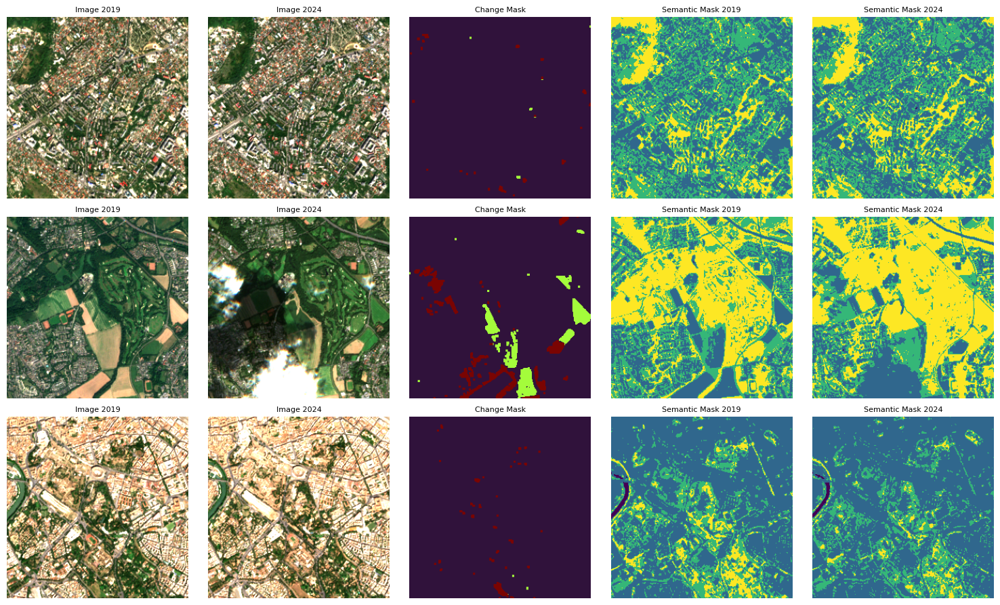


Visualizing validation samples...

Sample 0 - Oklahoma_Austin_N_2019_4.png:
Change mask values: tensor([0, 1, 2])
Semantic mask 2019 values: tensor([1, 2, 3])
Semantic mask 2024 values: tensor([1, 2, 3])

Sample 1 - Louisianna_NewOrleans_C_2019_1.png:
Change mask values: tensor([0, 1, 2])
Semantic mask 2019 values: tensor([0, 1, 2, 3])
Semantic mask 2024 values: tensor([0, 1, 2, 3])

Sample 2 - Alabama_Dayton_SW_2019_1.png:
Change mask values: tensor([0, 1, 2])
Semantic mask 2019 values: tensor([0, 1, 2, 3])
Semantic mask 2024 values: tensor([0, 1, 2, 3])


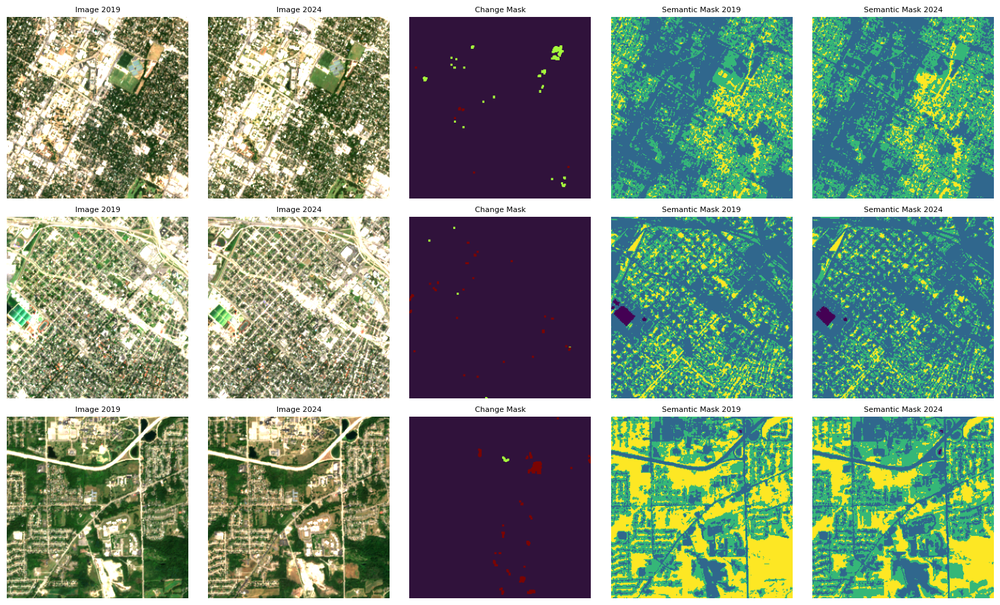


Visualizing test samples...

Sample 0 - Maine_Bangor_W_2019_4.png:
Change mask values: tensor([0, 1, 2])
Semantic mask 2019 values: tensor([1, 2, 3])
Semantic mask 2024 values: tensor([1, 2, 3])

Sample 1 - Massachussets_Lowell_N_2019_4.png:
Change mask values: tensor([0, 1, 2])
Semantic mask 2019 values: tensor([1, 2, 3])
Semantic mask 2024 values: tensor([1, 2, 3])

Sample 2 - Alabama_Toledo_NW_2019_1.png:
Change mask values: tensor([0, 1, 2])
Semantic mask 2019 values: tensor([1, 2, 3])
Semantic mask 2024 values: tensor([1, 2, 3])


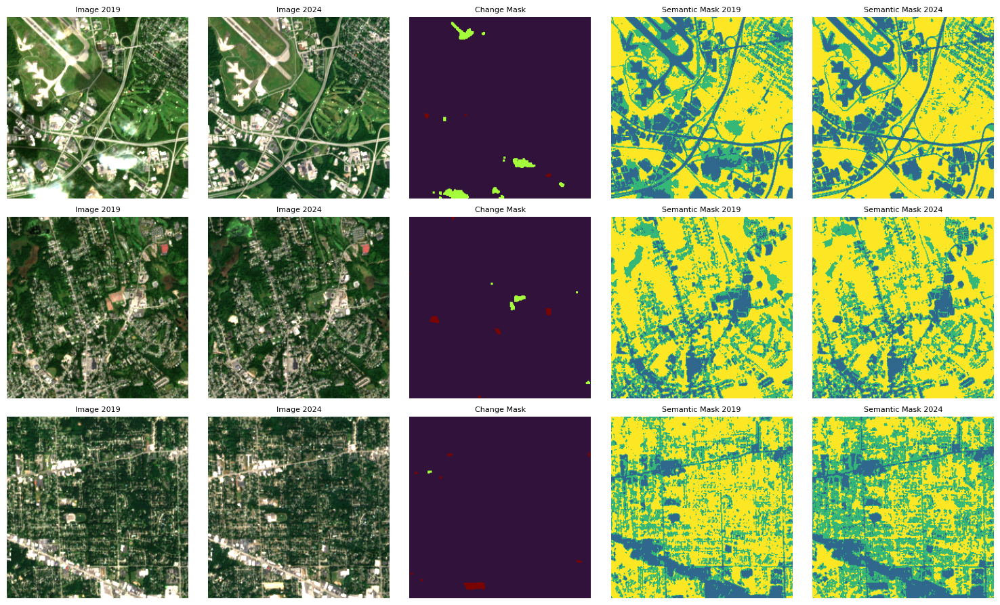

In [ ]:
import random
import matplotlib.pyplot as plt
import torch

def visualize_samples(loader, num_samples=3):
    dataset = loader.dataset
    fig, axes = plt.subplots(num_samples, 5, figsize=(15, 3 * num_samples))  # Reduced figure size

    # Randomly select indices for samples
    indices = random.sample(range(len(dataset)), num_samples)

    for i, idx in enumerate(indices):
        sample = dataset[idx]

        # Plot 2019 image
        axes[i, 0].imshow(sample['img_t2019'].permute(1, 2, 0))
        axes[i, 0].set_title('Image 2019', fontsize=8)
        axes[i, 0].axis('off')

        # Plot 2024 image
        axes[i, 1].imshow(sample['img_t2024'].permute(1, 2, 0))
        axes[i, 1].set_title('Image 2024', fontsize=8)
        axes[i, 1].axis('off')

        # Plot change detection mask
        im_cd = axes[i, 2].imshow(sample['cd_mask'], cmap='turbo', vmin=0, vmax=2)
        axes[i, 2].set_title('Change Mask', fontsize=8)
        axes[i, 2].axis('off')

        # Plot semantic masks
        im_sem_2019 = axes[i, 3].imshow(sample['sem_mask_2019'], cmap='viridis', vmin=0, vmax=3)
        axes[i, 3].set_title('Semantic Mask 2019', fontsize=8)
        axes[i, 3].axis('off')

        im_sem_2024 = axes[i, 4].imshow(sample['sem_mask_2024'], cmap='viridis', vmin=0, vmax=3)
        axes[i, 4].set_title('Semantic Mask 2024', fontsize=8)
        axes[i, 4].axis('off')

        # Print unique values
        print(f"\nSample {i} - {dataset.t2019_paths[idx]}:")
        print(f"Change mask values: {torch.unique(sample['cd_mask'])}")
        print(f"Semantic mask 2019 values: {torch.unique(sample['sem_mask_2019'])}")
        print(f"Semantic mask 2024 values: {torch.unique(sample['sem_mask_2024'])}")

    plt.tight_layout(pad=1.0, h_pad=1.0, w_pad=1.0)  # Adjust subplot spacing
    plt.show()

# Visualize training, validation, and test samples
print("\nVisualizing training samples...")
visualize_samples(train_loader)

print("\nVisualizing validation samples...")
visualize_samples(val_loader)

print("\nVisualizing test samples...")
visualize_samples(test_loader)



In [ ]:
import os
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
import segmentation_models_pytorch as smp
from tqdm import tqdm
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, cohen_kappa_score


class ChangeDetectionModel(nn.Module):
    def __init__(self, architecture='unet', encoder='resnet34', input_channels=3, num_classes=3):
        super().__init__()
        # Semantic segmentation models for each timestamp
        if architecture.lower() == 'unet':
            self.sem_model = smp.Unet(
                encoder_name=encoder,
                encoder_weights="imagenet",
                in_channels=input_channels,
                classes=4,
            )
        elif architecture.lower() == 'linknet':
            self.sem_model = smp.Linknet(
                encoder_name=encoder,
                encoder_weights="imagenet",
                in_channels=input_channels,
                classes=4,
            )
        elif architecture.lower() == 'pspnet':
            self.sem_model = smp.PSPNet(
                encoder_name=encoder,
                encoder_weights="imagenet",
                in_channels=input_channels,
                classes=4,
            )
        elif architecture.lower() == 'deeplabv3plus':
            self.sem_model = smp.DeepLabV3Plus(
                encoder_name=encoder,
                encoder_weights="imagenet",
                in_channels=input_channels,
                classes=4,
            )

        # Change detection head
        self.change_head = nn.Sequential(
            nn.Conv2d(8, 64, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 32, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(32, num_classes, kernel_size=1)
        )

    def forward(self, x1, x2):
        # Get semantic features for both timestamps
        sem_feat1 = self.sem_model(x1)
        sem_feat2 = self.sem_model(x2)

        # Concatenate semantic features
        combined_feat = torch.cat([sem_feat1, sem_feat2], dim=1)

        # Get change detection output
        change_out = self.change_head(combined_feat)

        return sem_feat1, sem_feat2, change_out




# def calculate_metrics_batch(predictions, targets):
#     """Calculate metrics for a single batch to reduce memory usage"""
#     pred_flat = predictions.flatten()
#     target_flat = targets.flatten()

#     # Calculate metrics for this batch
#     acc = accuracy_score(target_flat, pred_flat)
#     prec = precision_score(target_flat, pred_flat, average='macro', zero_division=0)
#     rec = recall_score(target_flat, pred_flat, average='macro', zero_division=0)
#     f1 = f1_score(target_flat, pred_flat, average='macro', zero_division=0)

#     return acc, prec, rec, f1

def calculate_metrics_batch(predictions, targets):
    """Calculate comprehensive metrics for change detection"""
    pred_flat = predictions.flatten()
    target_flat = targets.flatten()

    # Basic metrics with macro and weighted averaging
    acc = accuracy_score(target_flat, pred_flat)

    # Class-wise precision, recall, f1
    prec_class = precision_score(target_flat, pred_flat, average=None, zero_division=0)
    rec_class = recall_score(target_flat, pred_flat, average=None, zero_division=0)
    f1_class = f1_score(target_flat, pred_flat, average=None, zero_division=0)

    # Macro averaged metrics
    prec_macro = np.mean(prec_class)
    rec_macro = np.mean(rec_class)
    f1_macro = np.mean(f1_class)

    # Weighted metrics (accounts for class imbalance)
    prec_weighted = precision_score(target_flat, pred_flat, average='weighted', zero_division=0)
    rec_weighted = recall_score(target_flat, pred_flat, average='weighted', zero_division=0)
    f1_weighted = f1_score(target_flat, pred_flat, average='weighted', zero_division=0)

    # Cohen's Kappa
    kappa = cohen_kappa_score(target_flat, pred_flat)

    # Mean IoU
    def compute_iou(pred, target, cls):
        pred_mask = pred == cls
        target_mask = target == cls
        intersection = np.logical_and(pred_mask, target_mask).sum()
        union = np.logical_or(pred_mask, target_mask).sum()
        return intersection / (union + 1e-6)  # avoid division by zero

    class_ious = [compute_iou(pred_flat, target_flat, cls) for cls in range(3)]
    miou = np.mean(class_ious)

    return {
        'accuracy': acc,
        'kappa': kappa,
        'miou': miou,
        'class_ious': class_ious,
        'precision_macro': prec_macro,
        'recall_macro': rec_macro,
        'f1_macro': f1_macro,
        'precision_weighted': prec_weighted,
        'recall_weighted': rec_weighted,
        'f1_weighted': f1_weighted,
        'class_precision': prec_class,
        'class_recall': rec_class,
        'class_f1': f1_class
    }





def plot_results_pcc(img1, img2, sem_pred1, sem_pred2, sem_gt1, sem_gt2,
                    change_pred, change_gt):
    """Plot the results from the PCC model in notebook cells"""
    fig, axes = plt.subplots(2, 4, figsize=(20, 10))

    # Plot images
    axes[0, 0].imshow(img1.cpu().permute(1, 2, 0))
    axes[0, 0].set_title('Image 2019')
    axes[0, 1].imshow(img2.cpu().permute(1, 2, 0))
    axes[0, 1].set_title('Image 2024')

    # Plot semantic predictions and ground truth
    axes[0, 2].imshow(sem_pred1.cpu())
    axes[0, 2].set_title('Semantic Pred 2019')
    axes[0, 3].imshow(sem_pred2.cpu())
    axes[0, 3].set_title('Semantic Pred 2024')

    axes[1, 0].imshow(sem_gt1.cpu())
    axes[1, 0].set_title('Semantic GT 2019')
    axes[1, 1].imshow(sem_gt2.cpu())
    axes[1, 1].set_title('Semantic GT 2024')

    # Plot change detection results
    axes[1, 2].imshow(change_pred.cpu())
    axes[1, 2].set_title('Change Prediction')
    axes[1, 3].imshow(change_gt.cpu())
    axes[1, 3].set_title('Change GT')

    plt.tight_layout()
    plt.show()


def train_model_pcc(model, train_loader, val_loader, num_epochs, device,
                   checkpoint_path, weighting_method='square_balanced', loss='CE'):
    """Train the PCC model with optimized metrics calculation"""
    # Initialize loss functions based on weighting method and loss type
    if loss == 'CE':
        if weighting_method == 'square_balanced':
            weights = torch.tensor([1.0, 2.0, 2.0]).to(device)
            sem_criterion = nn.CrossEntropyLoss()
            change_criterion = nn.CrossEntropyLoss(weight=weights)
        else:
            sem_criterion = nn.CrossEntropyLoss()
            change_criterion = nn.CrossEntropyLoss()
    elif loss == 'focal':
        raise NotImplementedError("Focal loss not implemented yet")

    optimizer = optim.Adam(model.parameters(), lr=1e-4)
    best_val_loss = float('inf')
    history = {'train_loss': [], 'val_loss': [], 'val_metrics': []}

    for epoch in range(num_epochs):
        # Training phase
        model.train()
        train_loss = 0.0
        progress_bar = tqdm(train_loader, desc=f'Epoch {epoch+1}/{num_epochs}')

        for batch in progress_bar:
            img_t2019 = batch['img_t2019'].to(device)
            img_t2024 = batch['img_t2024'].to(device)
            sem_mask_2019 = batch['sem_mask_2019'].to(device)
            sem_mask_2024 = batch['sem_mask_2024'].to(device)
            cd_mask = batch['cd_mask'].to(device)

            optimizer.zero_grad()
            sem_out1, sem_out2, change_out = model(img_t2019, img_t2024)

            sem_loss = (sem_criterion(sem_out1, sem_mask_2019) +
                       sem_criterion(sem_out2, sem_mask_2024)) / 2
            change_loss = change_criterion(change_out, cd_mask)
            loss = sem_loss + change_loss

            loss.backward()
            optimizer.step()

            train_loss += loss.item()
            progress_bar.set_postfix({'loss': f'{loss.item():.4f}'})

        avg_train_loss = train_loss / len(train_loader)

        # Validation phase
        model.eval()
        val_loss = 0.0
        val_metrics_list = []

        with torch.no_grad():
            for batch in val_loader:
                img_t2019 = batch['img_t2019'].to(device)
                img_t2024 = batch['img_t2024'].to(device)
                sem_mask_2019 = batch['sem_mask_2019'].to(device)
                sem_mask_2024 = batch['sem_mask_2024'].to(device)
                cd_mask = batch['cd_mask'].to(device)

                sem_out1, sem_out2, change_out = model(img_t2019, img_t2024)

                sem_loss = (sem_criterion(sem_out1, sem_mask_2019) +
                           sem_criterion(sem_out2, sem_mask_2024)) / 2
                change_loss = change_criterion(change_out, cd_mask)
                loss = sem_loss + change_loss

                val_loss += loss.item()

                # Calculate metrics for this batch
                preds = torch.argmax(change_out, dim=1).cpu().numpy()
                targets = cd_mask.cpu().numpy()
                batch_metrics = calculate_metrics_batch(preds, targets)
                val_metrics_list.append(batch_metrics)

        avg_val_loss = val_loss / len(val_loader)

        # Average metrics across batches
        val_metrics = {}
        for key in val_metrics_list[0].keys():
            if key in ['class_ious', 'class_precision', 'class_recall', 'class_f1']:
                val_metrics[key] = np.mean([m[key] for m in val_metrics_list], axis=0)
            else:
                val_metrics[key] = np.mean([m[key] for m in val_metrics_list])

        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'val_loss': best_val_loss,
            }, checkpoint_path)
            print(f"Saved best model checkpoint to {checkpoint_path}")

        history['train_loss'].append(avg_train_loss)
        history['val_loss'].append(avg_val_loss)
        history['val_metrics'].append(val_metrics)

        print(f"\nEpoch {epoch+1}/{num_epochs}")
        print(f"Train Loss: {avg_train_loss:.4f}")
        print(f"Val Loss: {avg_val_loss:.4f}")
        print(f"Metrics - Accuracy: {val_metrics['accuracy']:.4f}, "
              f"Kappa: {val_metrics['kappa']:.4f}, "
              f"mIoU: {val_metrics['miou']:.4f}")

    return model, history




# def train_model_pcc(model, train_loader, val_loader, num_epochs, device,
#                    checkpoint_path, weighting_method='square_balanced', loss='CE'):
#     """Train the PCC model with optimized metrics calculation"""
#     # Initialize loss functions based on weighting method and loss type
#     if loss == 'CE':
#         if weighting_method == 'square_balanced':
#             weights = torch.tensor([1.0, 2.0, 2.0]).to(device)
#             sem_criterion = nn.CrossEntropyLoss()
#             change_criterion = nn.CrossEntropyLoss(weight=weights)
#         else:
#             sem_criterion = nn.CrossEntropyLoss()
#             change_criterion = nn.CrossEntropyLoss()
#     elif loss == 'focal':
#         raise NotImplementedError("Focal loss not implemented yet")

#     optimizer = optim.Adam(model.parameters(), lr=1e-4)
#     best_val_loss = float('inf')
#     history = {'train_loss': [], 'val_loss': [], 'val_metrics': []}

#     for epoch in range(num_epochs):
#         # Training phase
#         model.train()
#         train_loss = 0.0
#         progress_bar = tqdm(train_loader, desc=f'Epoch {epoch+1}/{num_epochs}')

#         for batch in progress_bar:
#             img_t2019 = batch['img_t2019'].to(device)
#             img_t2024 = batch['img_t2024'].to(device)
#             sem_mask_2019 = batch['sem_mask_2019'].to(device)
#             sem_mask_2024 = batch['sem_mask_2024'].to(device)
#             cd_mask = batch['cd_mask'].to(device)

#             optimizer.zero_grad()
#             sem_out1, sem_out2, change_out = model(img_t2019, img_t2024)

#             sem_loss = (sem_criterion(sem_out1, sem_mask_2019) +
#                        sem_criterion(sem_out2, sem_mask_2024)) / 2
#             change_loss = change_criterion(change_out, cd_mask)
#             loss = sem_loss + change_loss

#             loss.backward()
#             optimizer.step()

#             train_loss += loss.item()
#             progress_bar.set_postfix({'loss': f'{loss.item():.4f}'})

#         avg_train_loss = train_loss / len(train_loader)

#         # Validation phase
#         model.eval()
#         val_loss = 0.0
#         val_acc, val_prec, val_rec, val_f1 = [], [], [], []

#         with torch.no_grad():
#             for batch in val_loader:
#                 img_t2019 = batch['img_t2019'].to(device)
#                 img_t2024 = batch['img_t2024'].to(device)
#                 sem_mask_2019 = batch['sem_mask_2019'].to(device)
#                 sem_mask_2024 = batch['sem_mask_2024'].to(device)
#                 cd_mask = batch['cd_mask'].to(device)

#                 sem_out1, sem_out2, change_out = model(img_t2019, img_t2024)

#                 sem_loss = (sem_criterion(sem_out1, sem_mask_2019) +
#                            sem_criterion(sem_out2, sem_mask_2024)) / 2
#                 change_loss = change_criterion(change_out, cd_mask)
#                 loss = sem_loss + change_loss

#                 val_loss += loss.item()

#                 # Calculate metrics for this batch
#                 preds = torch.argmax(change_out, dim=1).cpu().numpy()
#                 targets = cd_mask.cpu().numpy()
#                 acc, prec, rec, f1 = calculate_metrics_batch(preds, targets)

#                 val_acc.append(acc)
#                 val_prec.append(prec)
#                 val_rec.append(rec)
#                 val_f1.append(f1)

#         avg_val_loss = val_loss / len(val_loader)

#         # Average metrics across batches
#         metrics = {
#             'accuracy': np.mean(val_acc),
#             'precision': np.mean(val_prec),
#             'recall': np.mean(val_rec),
#             'f1': np.mean(val_f1)
#         }

#         if avg_val_loss < best_val_loss:
#             best_val_loss = avg_val_loss
#             torch.save({
#                 'epoch': epoch,
#                 'model_state_dict': model.state_dict(),
#                 'optimizer_state_dict': optimizer.state_dict(),
#                 'val_loss': best_val_loss,
#             }, checkpoint_path)
#             print(f"Saved best model checkpoint to {checkpoint_path}")

#         history['train_loss'].append(avg_train_loss)
#         history['val_loss'].append(avg_val_loss)
#         history['val_metrics'].append(metrics)

#         print(f"\nEpoch {epoch+1}/{num_epochs}")
#         print(f"Train Loss: {avg_train_loss:.4f}")
#         print(f"Val Loss: {avg_val_loss:.4f}")
#         print(f"Metrics - Accuracy: {metrics['accuracy']:.4f}, "
#               f"Precision: {metrics['precision']:.4f}, "
#               f"Recall: {metrics['recall']:.4f}, "
#               f"F1: {metrics['f1']:.4f}")

#     return model, history


# def test_model_pcc(model, test_loader, device, num_samples_to_plot=5):
#     """Test the PCC model and display random results after testing"""
#     model.eval()
#     test_acc, test_prec, test_rec, test_f1 = [], [], [], []

#     # Store all predictions for later plotting
#     all_predictions = []

#     with torch.no_grad():
#         for batch in tqdm(test_loader, desc='Testing'):
#             img_t2019 = batch['img_t2019'].to(device)
#             img_t2024 = batch['img_t2024'].to(device)
#             sem_mask_2019 = batch['sem_mask_2019'].to(device)
#             sem_mask_2024 = batch['sem_mask_2024'].to(device)
#             cd_mask = batch['cd_mask'].to(device)

#             sem_out1, sem_out2, change_out = model(img_t2019, img_t2024)

#             # Get predictions
#             sem_pred1 = torch.argmax(sem_out1, dim=1)
#             sem_pred2 = torch.argmax(sem_out2, dim=1)
#             change_pred = torch.argmax(change_out, dim=1)

#             # Calculate metrics
#             preds = change_pred.cpu().numpy()
#             targets = cd_mask.cpu().numpy()
#             acc, prec, rec, f1 = calculate_metrics_batch(preds, targets)

#             test_acc.append(acc)
#             test_prec.append(prec)
#             test_rec.append(rec)
#             test_f1.append(f1)

#             # Store batch results for plotting
#             all_predictions.append({
#                 'img_t2019': img_t2019.cpu(),
#                 'img_t2024': img_t2024.cpu(),
#                 'sem_pred1': sem_pred1.cpu(),
#                 'sem_pred2': sem_pred2.cpu(),
#                 'sem_mask_2019': sem_mask_2019.cpu(),
#                 'sem_mask_2024': sem_mask_2024.cpu(),
#                 'change_pred': change_pred.cpu(),
#                 'cd_mask': cd_mask.cpu()
#             })

#     # Print metrics
#     print("\nTest Metrics:")
#     print(f"Accuracy: {np.mean(test_acc):.4f} ± {np.std(test_acc):.4f}")
#     print(f"Precision: {np.mean(test_prec):.4f} ± {np.std(test_prec):.4f}")
#     print(f"Recall: {np.mean(test_rec):.4f} ± {np.std(test_rec):.4f}")
#     print(f"F1 Score: {np.mean(test_f1):.4f} ± {np.std(test_f1):.4f}")

#     # Plot random samples after testing is complete
#     total_samples = len(all_predictions)
#     random_indices = np.random.choice(total_samples, num_samples_to_plot, replace=False)

#     print(f"\nPlotting {num_samples_to_plot} random samples:")
#     for idx in random_indices:
#         batch = all_predictions[idx]
#         plot_results_pcc(
#             batch['img_t2019'][0],
#             batch['img_t2024'][0],
#             batch['sem_pred1'][0],
#             batch['sem_pred2'][0],
#             batch['sem_mask_2019'][0],
#             batch['sem_mask_2024'][0],
#             batch['change_pred'][0],
#             batch['cd_mask'][0]
#         )

#     return {
#         'accuracy': np.mean(test_acc),
#         'precision': np.mean(test_prec),
#         'recall': np.mean(test_rec),
#         'f1': np.mean(test_f1)
#     }



def test_model_pcc(model, test_loader, device, num_samples_to_plot=5):
    """Test the PCC model with enhanced metrics"""
    model.eval()
    all_metrics = []
    all_predictions = []

    with torch.no_grad():
        for batch in tqdm(test_loader, desc='Testing'):
            img_t2019 = batch['img_t2019'].to(device)
            img_t2024 = batch['img_t2024'].to(device)
            sem_mask_2019 = batch['sem_mask_2019'].to(device)
            sem_mask_2024 = batch['sem_mask_2024'].to(device)
            cd_mask = batch['cd_mask'].to(device)

            sem_out1, sem_out2, change_out = model(img_t2019, img_t2024)

            # Get predictions
            sem_pred1 = torch.argmax(sem_out1, dim=1)
            sem_pred2 = torch.argmax(sem_out2, dim=1)
            change_pred = torch.argmax(change_out, dim=1)

            # Calculate metrics
            batch_metrics = calculate_metrics_batch(
                change_pred.cpu().numpy(),
                cd_mask.cpu().numpy()
            )
            all_metrics.append(batch_metrics)

            # Store predictions for plotting
            all_predictions.append({
                'img_t2019': img_t2019.cpu(),
                'img_t2024': img_t2024.cpu(),
                'sem_pred1': sem_pred1.cpu(),
                'sem_pred2': sem_pred2.cpu(),
                'sem_mask_2019': sem_mask_2019.cpu(),
                'sem_mask_2024': sem_mask_2024.cpu(),
                'change_pred': change_pred.cpu(),
                'cd_mask': cd_mask.cpu()
            })

    # Aggregate metrics across all batches
    final_metrics = {}
    for key in all_metrics[0].keys():
        if key in ['class_ious', 'class_precision', 'class_recall', 'class_f1']:
            # For class-wise metrics, keep array format
            values = np.array([m[key] for m in all_metrics])
            final_metrics[key] = np.mean(values, axis=0)
            final_metrics[f'{key}_std'] = np.std(values, axis=0)
        else:
            # For scalar metrics, compute mean and std
            values = [m[key] for m in all_metrics]
            final_metrics[key] = np.mean(values)
            final_metrics[f'{key}_std'] = np.std(values)

    # Print detailed metrics
    print("\nTest Metrics:")
    print(f"Overall Accuracy: {final_metrics['accuracy']:.4f} ± {final_metrics['accuracy_std']:.4f}")
    print(f"Kappa Score: {final_metrics['kappa']:.4f} ± {final_metrics['kappa_std']:.4f}")
    print(f"Mean IoU: {final_metrics['miou']:.4f} ± {final_metrics['miou_std']:.4f}")

    print("\nClass-wise IoU:")
    for i, iou in enumerate(final_metrics['class_ious']):
        print(f"Class {i}: {iou:.4f} ± {final_metrics['class_ious_std'][i]:.4f}")

    print("\nClass-wise F1 Scores:")
    for i, f1 in enumerate(final_metrics['class_f1']):
        print(f"Class {i}: {f1:.4f} ± {final_metrics['class_f1_std'][i]:.4f}")

    # Plot random samples
    total_samples = len(all_predictions)
    random_indices = np.random.choice(total_samples, num_samples_to_plot, replace=False)

    print(f"\nPlotting {num_samples_to_plot} random samples:")
    for idx in random_indices:
        batch = all_predictions[idx]
        plot_results_pcc(
            batch['img_t2019'][0],
            batch['img_t2024'][0],
            batch['sem_pred1'][0],
            batch['sem_pred2'][0],
            batch['sem_mask_2019'][0],
            batch['sem_mask_2024'][0],
            batch['change_pred'][0],
            batch['cd_mask'][0]
        )

    return final_metrics


In [22]:
# Initialize model and device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
architecture = 'deeplabv3plus'  # or 'linknet', 'pspnet', 'deeplabv3plus'
num_classes = 3
num_epochs = 2
weighting_method = 'square_balanced'
loss = 'CE'
checkpoint_path = f'/content/drive/MyDrive/BTech_Project/best_{architecture}_{num_epochs}_epochs.pt'

# Create model
model = ChangeDetectionModel(
    architecture=architecture,
    encoder='resnet34',
    input_channels=3,
    num_classes=num_classes
).to(device)

# Train model
model, history = train_model_pcc(
    model=model,
    train_loader=train_loader,
    val_loader=val_loader,
    num_epochs=num_epochs,
    device=device,
    checkpoint_path=checkpoint_path,
    weighting_method=weighting_method,
    loss=loss
)


Epoch 1/2: 100%|██████████| 235/235 [02:08<00:00,  1.82it/s, loss=0.8048]


Saved best model checkpoint to /content/drive/MyDrive/BTech_Project/best_deeplabv3plus_2_epochs.pt

Epoch 1/2
Train Loss: 1.0382
Val Loss: 0.6758
Metrics - Accuracy: 0.9763, Kappa: 0.5763, mIoU: 0.5600


Epoch 2/2: 100%|██████████| 235/235 [02:08<00:00,  1.83it/s, loss=0.7551]


Saved best model checkpoint to /content/drive/MyDrive/BTech_Project/best_deeplabv3plus_2_epochs.pt

Epoch 2/2
Train Loss: 0.6747
Val Loss: 0.6266
Metrics - Accuracy: 0.9766, Kappa: 0.6341, mIoU: 0.6149


Testing: 100%|██████████| 51/51 [01:57<00:00,  2.31s/it]



Test Metrics:
Overall Accuracy: 0.9731 ± 0.0175
Kappa Score: 0.5286 ± 0.0973
Mean IoU: 0.5462 ± 0.0705

Class-wise IoU:
Class 0: 0.9727 ± 0.0180
Class 1: 0.2892 ± 0.1778
Class 2: 0.3767 ± 0.0881

Class-wise F1 Scores:
Class 0: 0.9861 ± 0.0095
Class 1: 0.4191 ± 0.2155
Class 2: 0.5413 ± 0.0933

Plotting 5 random samples:


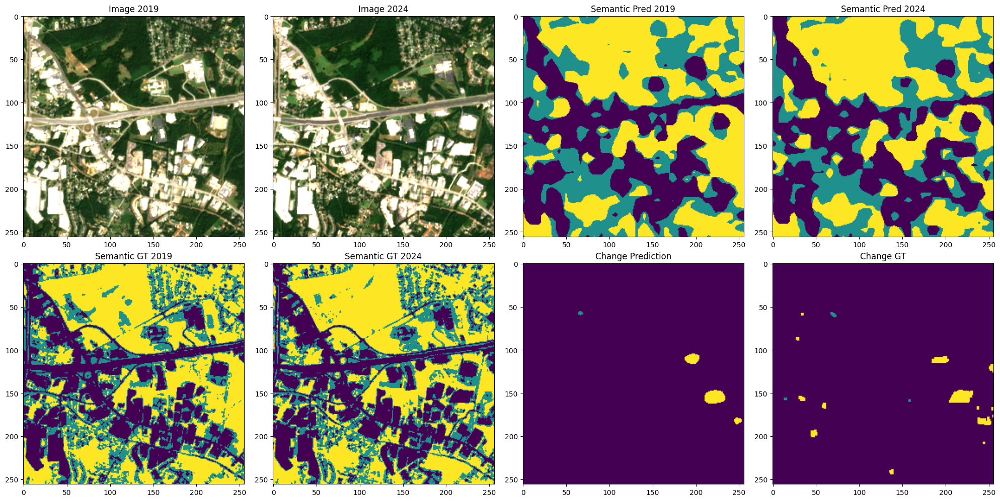

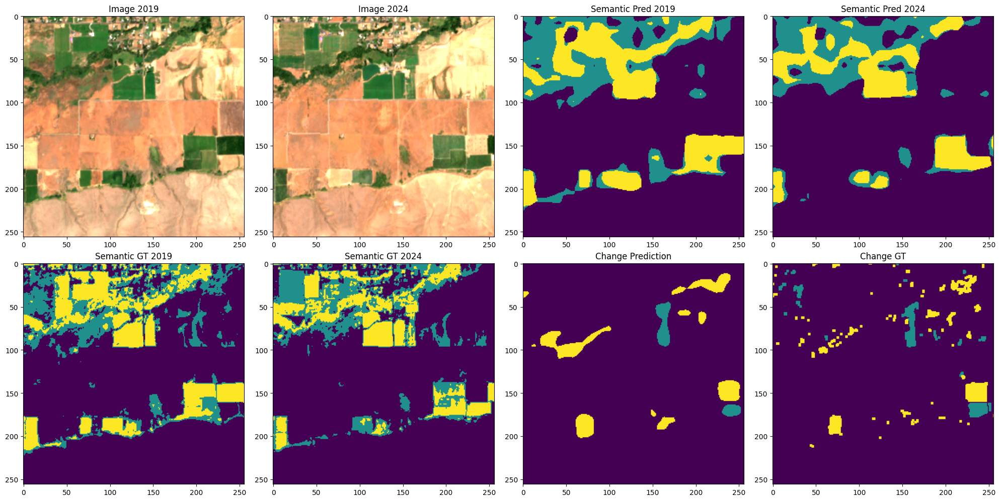

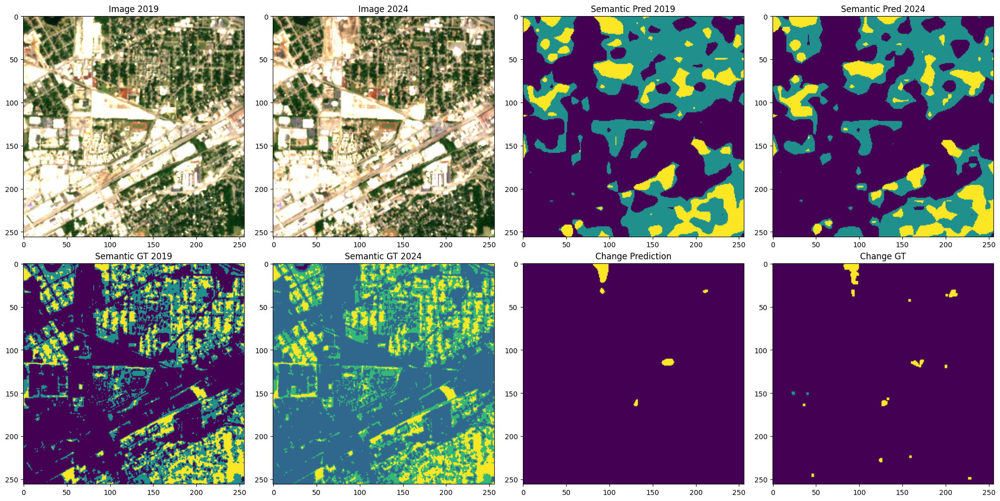

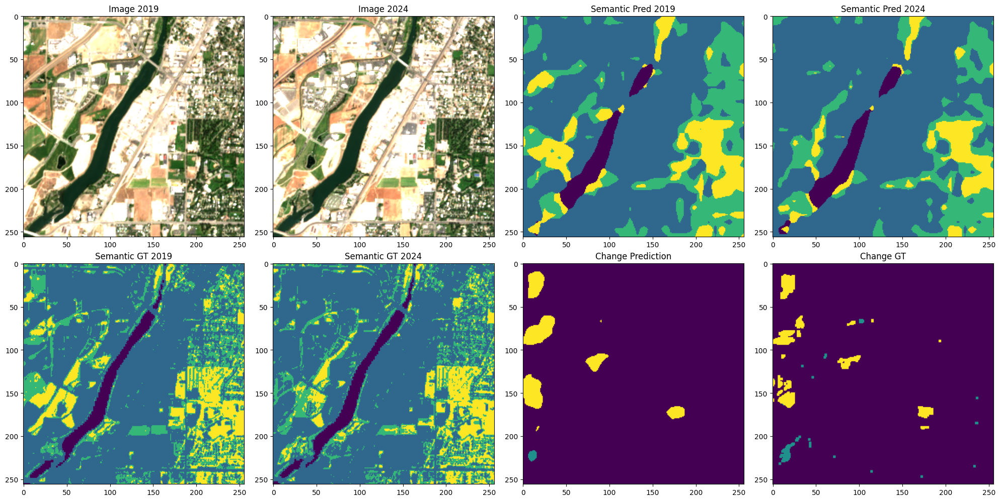

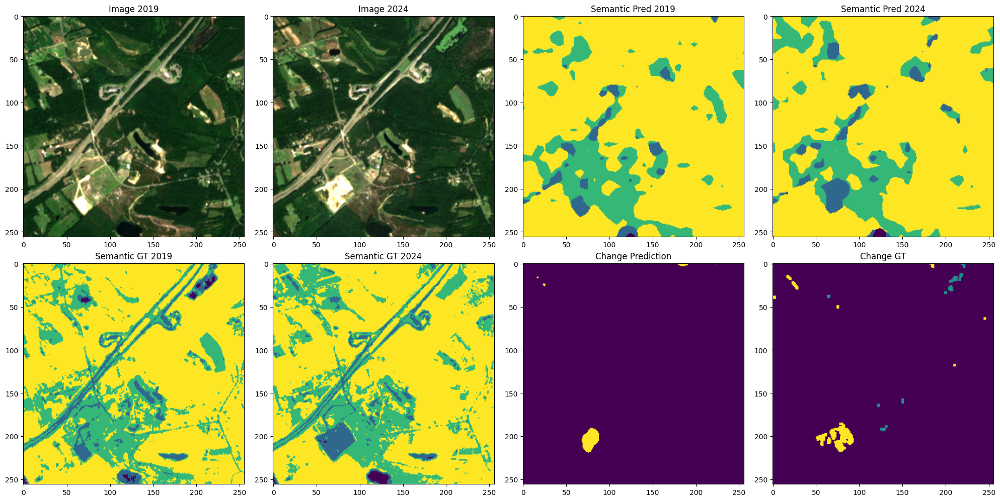

In [21]:
test_metrics = test_model_pcc(model, test_loader, device, num_samples_to_plot=5)